In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import rcParams
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

In [2]:
#configure Pandas to display all 23 columns
pd.set_option("display.max.rows", None)
#show only two decimal places
pd.set_option("display.precision", 2)

In [3]:
#configure Pandas to display all 23 columns
pd.set_option("display.max.columns", None)
#show only two decimal places
pd.set_option("display.precision", 2)

In [4]:
z = pd.read_csv("z1.csv")

In [5]:
z.head()

,name,online_order,book_table,rate,votes,location,rest_type,dish_liked,cuisines,average_cost,reviews_list,menu_item,restaurant_type,locality
0,Jalsa,Yes,Yes,4.1,775,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800.0,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
1,Spice Elephant,Yes,No,4.1,787,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800.0,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari
2,San Churro Cafe,Yes,No,3.8,918,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800.0,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari
3,Addhuri Udupi Bhojana,No,No,3.7,88,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300.0,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari
4,Grand Village,No,No,3.8,166,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600.0,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,Banashankari


In [6]:
zc=z[['name','location','rate','votes','location','average_cost','rest_type','dish_liked','cuisines','restaurant_type']]

In [7]:
zc.head()

,name,location,rate,votes,location,average_cost,rest_type,dish_liked,cuisines,restaurant_type
0,Jalsa,Banashankari,4.1,775,Banashankari,800.0,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",Buffet
1,Spice Elephant,Banashankari,4.1,787,Banashankari,800.0,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",Buffet
2,San Churro Cafe,Banashankari,3.8,918,Banashankari,800.0,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",Buffet
3,Addhuri Udupi Bhojana,Banashankari,3.7,88,Banashankari,300.0,Quick Bites,Masala Dosa,"South Indian, North Indian",Buffet
4,Grand Village,Basavanagudi,3.8,166,Basavanagudi,600.0,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",Buffet


In [8]:
zc.drop_duplicates(inplace=True)

C:\Users\h19baman\Anaconda3\envs\Bussiness intelligence\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [9]:
zc.isna().sum()

name               0
location           0
rate               0
votes              0
location           0
average_cost       0
rest_type          0
dish_liked         0
cuisines           0
restaurant_type    0
dtype: int64

In [10]:
# we will do the same for rate column
bins =[0,2,3,4,5]
labels =['low','moderate','high','exceptional']
zc['rate_range'] = pd.cut(zc.rate, bins=bins,labels=labels)
zc['rate_range'].head()

C:\Users\h19baman\Anaconda3\envs\Bussiness intelligence\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


0    exceptional
1    exceptional
2           high
3           high
4           high
Name: rate_range, dtype: category
Categories (4, object): [low < moderate < high < exceptional]

In [11]:
zc.head()

,name,location,rate,votes,location,average_cost,rest_type,dish_liked,cuisines,restaurant_type,rate_range
0,Jalsa,Banashankari,4.1,775,Banashankari,800.0,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",Buffet,exceptional
1,Spice Elephant,Banashankari,4.1,787,Banashankari,800.0,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",Buffet,exceptional
2,San Churro Cafe,Banashankari,3.8,918,Banashankari,800.0,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",Buffet,high
3,Addhuri Udupi Bhojana,Banashankari,3.7,88,Banashankari,300.0,Quick Bites,Masala Dosa,"South Indian, North Indian",Buffet,high
4,Grand Village,Basavanagudi,3.8,166,Basavanagudi,600.0,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",Buffet,high


In [12]:
zc.restaurant_type.unique()

array(['Buffet', 'Cafes', 'Delivery', 'Desserts', 'Dine-out',
       'Drinks & nightlife', 'Pubs and bars'], dtype=object)

In [14]:
# zc_clus=zc.drop(['name','rate_range','rest_type'],1)

# #creating duplicates for standardization purpose and comparing results
# zc_clus_std=zc_clus
# zc_clus_copy=zc_clus

# zc_clus.head()

In [16]:
kmeans = KMeans(n_clusters=7)
kmeans.fit(zc)

ValueError: could not convert string to float: 'exceptional'

In [219]:
kmeans.cluster_centers_

array([[ 0.82428465, -1.29100637, -0.29488817, -0.05751808, -0.01644358,
         0.04059194, -0.18048985, -0.01804638],
       [-1.3251444 ,  0.67602314, -0.44606436, -0.06727272, -0.01259   ,
         0.04141265, -0.24887325,  0.08865508],
       [ 2.29280675,  2.27214606, -0.54498396, -0.52546017, -3.59144687,
        -1.13740059,  1.49776488, -0.75182042],
       [-0.27887174,  0.01757723,  3.51003786, -1.84389101, -0.01260337,
        -0.24417064,  0.25112091,  0.48382332],
       [ 1.85602023,  1.82784313, -0.33046674,  0.08802978,  3.61312806,
        -3.30757754,  0.97515243, -0.6460337 ],
       [ 0.17605179,  0.36989914,  2.01658508,  4.14266483, -0.3634881 ,
         0.01965949,  0.16686813,  0.20471689],
       [ 2.05916647,  2.08014506, -0.03788105, -0.31086265,  1.70775925,
         4.46891703,  1.72152695, -0.5972517 ]])

C:\Users\h19baman\Anaconda3\envs\Bussiness intelligence\lib\site-packages\matplotlib\collections.py:886: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


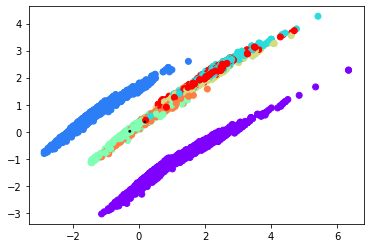

In [220]:
plt.scatter(principalComponents[:,0],principalComponents[:,1], c=kmeans.labels_, cmap='rainbow')
plt.scatter(kmeans.cluster_centers_[:,0] ,kmeans.cluster_centers_[:,1],kmeans.cluster_centers_[:,2], color='black')

In [221]:
zc['clusters'] =kmeans.labels_

In [222]:
col.extend(['clusters'])

In [223]:
zc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11542 entries, 0 to 11541
Data columns (total 16 columns):
 #   Column                   Non-Null Count  Dtype   
---  ------                   --------------  -----   
 0   name                     11542 non-null  object  
 1   location                 11542 non-null  object  
 2   rate                     11542 non-null  float64 
 3   average_cost             11542 non-null  float64 
 4   rest_type                11542 non-null  object  
 5   dish_liked               11542 non-null  object  
 6   cuisines                 11542 non-null  object  
 7   rate_range               11542 non-null  category
 8   type_Buffet              11542 non-null  uint8   
 9   type_Cafes               11542 non-null  uint8   
 10  type_Delivery            11542 non-null  uint8   
 11  type_Desserts            11542 non-null  uint8   
 12  type_Dine-out            11542 non-null  uint8   
 13  type_Drinks & nightlife  11542 non-null  uint8   
 14  type_P

In [224]:
zc.groupby('clusters').describe()

rate                                      average_cost           \
           count  mean   std  min  25%  50%  75%  max        count     mean   
clusters                                                                      
0         4476.0  3.87  0.46  1.8  3.7  3.9  4.1  4.9       4476.0   795.30   
1         4573.0  3.83  0.43  2.0  3.7  3.9  4.1  4.9       4573.0   606.54   
2          457.0  4.14  0.35  2.0  4.0  4.2  4.4  4.9        457.0  1488.84   
3          753.0  4.02  0.36  2.5  3.9  4.0  4.2  4.9        753.0   472.01   
4          381.0  4.06  0.41  2.3  3.9  4.1  4.3  4.9        381.0  1362.07   
5          548.0  3.99  0.39  2.3  3.8  4.1  4.2  4.7        548.0   683.76   
6          354.0  4.16  0.32  2.5  4.0  4.2  4.4  4.9        354.0  1379.10   

                                                        type_Buffet            \
             std    min     25%     50%     75%     max       count mean  std   
clusters                                                                        
0         574.96   40.0   400.0   600.0  1000.0  6000.0      4476.0  0.0  0.0   
1         344.29   40.0   400.0   500.0   750.0  3000.0      4573.0  0.0  0.0   
2         496.13  500.0  1200.0  1400.0  1600.0  4500.0       457.0  0.0  0.0   
3         269.09  100.0   300.0   400.0   500.0  2000.0       753.0  0.0  0.0   
4         608.40  300.0  1000.0  1300.0  1600.0  4100.0       381.0  1.0  0.0   
5         268.66  150.0   500.0   650.0   800.0  2500.0       548.0  0.0  0.0   
6         468.91  150.0  1100.0  1300.0  1500.0  4000.0       354.0  0.0  0.0   

                                  type_Cafes                                \
          min  25%  50%  75%  max      count mean  std  min  25%  50%  75%   
clusters                                                                     
0         0.0  0.0  0.0  0.0  0.0     4476.0  0.0  0.0  0.0  0.0  0.0  0.0   
1         0.0  0.0  0.0  0.0  0.0     4573.0  0.0  0.0  0.0  0.0  0.0  0.0   
2         0.0  0.0  0.0  0.0  0.0      457.0  0.0  0.0  0.0  0.0  0.0  0.0   
3         0.0  0.0  0.0  0.0  0.0      753.0  0.0  0.0  0.0  0.0  0.0  0.0   
4         1.0  1.0  1.0  1.0  1.0      381.0  0.0  0.0  0.0  0.0  0.0  0.0   
5         0.0  0.0  0.0  0.0  0.0      548.0  1.0  0.0  1.0  1.0  1.0  1.0   
6         0.0  0.0  0.0  0.0  0.0      354.0  0.0  0.0  0.0  0.0  0.0  0.0   

              type_Delivery                                    type_Desserts  \
          max         count mean  std  min  25%  50%  75%  max         count   
clusters                                                                       
0         0.0        4476.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0        4476.0   
1         0.0        4573.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0        4573.0   
2         0.0         457.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0         457.0   
3         0.0         753.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0         753.0   
4         0.0         381.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0         381.0   
5         1.0         548.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0         548.0   
6         0.0         354.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0         354.0   

                                            type_Dine-out                      \
         mean  std  min  25%  50%  75%  max         count mean  std  min  25%   
clusters                                                                        
0         0.0  0.0  0.0  0.0  0.0  0.0  0.0        4476.0  1.0  0.0  1.0  1.0   
1         0.0  0.0  0.0  0.0  0.0  0.0  0.0        4573.0  0.0  0.0  0.0  0.0   
2         0.0  0.0  0.0  0.0  0.0  0.0  0.0         457.0  0.0  0.0  0.0  0.0   
3         1.0  0.0  1.0  1.0  1.0  1.0  1.0         753.0  0.0  0.0  0.0  0.0   
4         0.0  0.0  0.0  0.0  0.0  0.0  0.0         381.0  0.0  0.0  0.0  0.0   
5         0.0  0.0  0.0  0.0  0.0  0.0  0.0         548.0  0.0  0.0  0.0  0.0   
6         0.0  0.0  0.0  0.0  0.0  0.0  0.0         354.0  0.0  0.0  0.0  0.0   

                 

In [225]:
zc["clusters"].value_counts()

1    4573
0    4476
3     753
5     548
2     457
4     381
6     354
Name: clusters, dtype: int64

In [226]:
zc0 = zc[zc["clusters"] == 0]

In [227]:
zc0

,name,location,rate,average_cost,rest_type,dish_liked,cuisines,rate_range,type_Buffet,type_Cafes,type_Delivery,type_Desserts,type_Dine-out,type_Drinks & nightlife,type_Pubs and bars,clusters
247,The Krishna Grand,Banashankari,3.9,750.0,Casual Dining,"Spring Dosa, Coffee, Spring Roll, Masala Papad...","North Indian, South Indian, Chinese, Fast Food...",high,0,0,0,0,1,0,0,0
248,Sea Spice by 7 Star,Banashankari,4.0,1200.0,Casual Dining,"Sea Food, Neer Dosa, Anjal Masala Fry, Coconut...","Seafood, Biryani, Beverages, South Indian, Nor...",high,0,0,0,0,1,0,0,0
249,Mini Punjabi Dhaba,Banashankari,4.2,350.0,Quick Bites,"Panneer Butter Masala, Lassi, Paratha, Jeera R...",North Indian,exceptional,0,0,0,0,1,0,0,0
250,Onesta,Banashankari,4.6,600.0,"Casual Dining, Cafe","Farmhouse Pizza, Chocolate Banana, Virgin Moji...","Pizza, Cafe, Italian",exceptional,0,0,0,0,1,0,0,0
251,Wamama,Banashankari,4.2,800.0,Casual Dining,"Sushi, Noodles, Wine, Khau Suey, Mocktails, Ya...","Asian, Korean, Indonesian, Japanese, Chinese, ...",exceptional,0,0,0,0,1,0,0,0
252,Jalsa,Banashankari,4.1,800.0,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",exceptional,0,0,0,0,1,0,0,0
253,Vinny's,Banashankari,4.2,800.0,Casual Dining,"Pizza, Pasta, Garlic Bread, Nachos, Penne Alfr...","Pizza, Italian, Continental, Desserts",exceptional,0,0,0,0,1,0,0,0
254,Jcubez,Banashankari,3.8,1300.0,Lounge,"Beer, Chicken Wings, Chilli Chicken, Onion Rin...",Finger Food,high,0,0,0,0,1,0,0,0
255,Gustoes Beer House,Banashankari,4.1,1200.0,Pub,"Beer, Wedges, Pizza, Nachos, Salads, Papaya Sa...","Continental, Italian, Mexican, North Indian, C...",exceptional,0,0,0,0,1,0,0,0
256,Penthouse Cafe,Banashankari,4.0,700.0,Cafe,"Pizza, Mocktails, Coffee, Nachos, Salad, Pasta...","Cafe, Italian, Continental",high,0,0,0,0,1,0,0,0


In [39]:
zc0.rest_type.unique()

array(['Quick Bites', 'Delivery', 'Casual Dining', 'Casual Dining, Cafe',
       'Dessert Parlor', 'Pub', 'Beverage Shop', 'Bar',
       'Takeaway, Delivery', 'Cafe', 'Quick Bites, Cafe', 'Food Truck',
       'Quick Bites, Dessert Parlor', 'Pub, Casual Dining',
       'Casual Dining, Bar', 'Bakery', 'Sweet Shop',
       'Dessert Parlor, Beverage Shop', 'Beverage Shop, Quick Bites',
       'Cafe, Casual Dining', 'Microbrewery, Casual Dining', 'Food Court',
       'Microbrewery', 'Sweet Shop, Quick Bites', 'Kiosk', 'Cafe, Bakery',
       'Pub, Bar', 'Casual Dining, Pub', 'Cafe, Quick Bites', 'Lounge',
       'Lounge, Bar', 'Bakery, Quick Bites',
       'Beverage Shop, Dessert Parlor', 'Casual Dining, Microbrewery',
       'Mess', 'Bakery, Dessert Parlor', 'Bar, Casual Dining',
       'Dessert Parlor, Cafe', 'Quick Bites, Sweet Shop',
       'Cafe, Dessert Parlor', 'Takeaway', 'Microbrewery, Pub',
       'Dessert Parlor, Quick Bites', 'Casual Dining, Irani Cafee',
       'Beverage Shop, C

In [166]:
zc0.dish_liked.unique()

array(['Pasta, Lunch Buffet, Masala Papad, Paneer Lajawab, Tomato Shorba, Dum Biryani, Sweet Corn Soup',
       'Momos, Lunch Buffet, Chocolate Nirvana, Thai Green Curry, Paneer Tikka, Dum Biryani, Chicken Biryani',
       'Churros, Cannelloni, Minestrone Soup, Hot Chocolate, Pink Sauce Pasta, Salsa, Veg Supreme Pizza',
       'Masala Dosa', 'Panipuri, Gol Gappe',
       'Onion Rings, Pasta, Kadhai Paneer, Salads, Salad, Roti, Jeera Rice',
       'Gajar Ka Halwa, Chilli Chicken, Hara Bhara Kebab, Custard, Brownie, Sev Puri, Pasta',
       'Mango Chiller, Fattoush, Prawn, Salads, Vegetable Biryani, Irani Chicken Tikka, Chilli Chicken',
       'Chicken Satay, Mutton Brain, Egg Biryani, Paneer Tikka Masala, Rolls, Lemon Chicken, Butter Chicken',
       'Egg Biryani, Chicken Curry, Chicken Boneless Biryani, Chilli Chicken, Vegetable Biryani, Jeera Rice',
       'Lunch Buffet, Goan Fish Curry, Mocktails, Chicken Biryani, Cocktails, Paan Kulfi, Pasta',
       'Noodles, Veg Buffet, Mango Juic

In [40]:
zc0.location.unique()

array(['Banashankari', 'Jayanagar', 'Basavanagudi', 'Kumaraswamy Layout',
       'Rajarajeshwari Nagar', 'Mysore Road', 'Uttarahalli',
       'South Bangalore', 'Vijay Nagar', 'BTM', 'JP Nagar',
       'Bannerghatta Road', 'Koramangala 5th Block', 'Shanti Nagar',
       'Wilson Garden', 'Richmond Road', 'City Market', 'Bellandur',
       'Marathahalli', 'Sarjapur Road', 'HSR', 'Old Airport Road',
       'Indiranagar', 'Koramangala 1st Block', 'East Bangalore',
       'Church Street', 'Domlur', 'St. Marks Road',
       'Koramangala 8th Block', 'Brigade Road', 'Frazer Town',
       'Residency Road', 'Ulsoor', 'Ejipura', 'Vasanth Nagar',
       'Jeevan Bhima Nagar', 'Cunningham Road', 'MG Road',
       'Old Madras Road', 'Race Course Road', 'Lavelle Road',
       'Commercial Street', 'Infantry Road', 'Koramangala 6th Block',
       'Majestic', 'Shivajinagar', 'Langford Town',
       'Varthur Main Road, Whitefield', 'Brookefield', 'Whitefield',
       'ITPL Main Road, Whitefield', 'Koraman

In [41]:
zc0.location.value_counts()

Indiranagar                      301
HSR                              282
Whitefield                       251
BTM                              220
Marathahalli                     219
Koramangala 5th Block            177
Jayanagar                        170
JP Nagar                         160
Bellandur                        122
Electronic City                  122
Sarjapur Road                    120
Bannerghatta Road                117
New BEL Road                     104
Kalyan Nagar                      98
Banashankari                      85
Brookefield                       84
Koramangala 6th Block             73
Malleshwaram                      69
Frazer Town                       66
Koramangala 1st Block             63
Koramangala 4th Block             62
Koramangala 7th Block             57
Kammanahalli                      57
Jeevan Bhima Nagar                57
Church Street                     52
Basavanagudi                      50
Old Airport Road                  49
B

In [87]:
zc0[["name"]].count()

name    4115
dtype: int64

In [90]:
zc0.groupby('name').count()

,location,rate,average_cost,rest_type,rate_range,type_Buffet,type_Cafes,type_Delivery,type_Desserts,type_Dine-out,type_Drinks & nightlife,type_Pubs and bars,clusters
name,,,,,,,,,,,,,
#L-81 Cafe,1,1,1,1,1,1,1,1,1,1,1,1,1
#refuel,1,1,1,1,1,1,1,1,1,1,1,1,1
1000 B.C,1,1,1,1,1,1,1,1,1,1,1,1,1
1441 Pizzeria,1,1,1,1,1,1,1,1,1,1,1,1,1
1522 - The Pub,2,2,2,2,2,2,2,2,2,2,2,2,2
154 Breakfast Club,1,1,1,1,1,1,1,1,1,1,1,1,1
1722 Urban Bistro,1,1,1,1,1,1,1,1,1,1,1,1,1
1947,4,4,4,4,4,4,4,4,4,4,4,4,4
1980s Games Cafe,1,1,1,1,1,1,1,1,1,1,1,1,1


In [128]:
zc0.groupby('rest_type').count()[['location']].sort_values(by=['location'], ascending=False)

,location
rest_type,
Casual Dining,1383
Quick Bites,1176
Cafe,276
Delivery,273
Dessert Parlor,198
"Takeaway, Delivery",142
"Casual Dining, Bar",79
Food Court,50
Beverage Shop,38


In [105]:
zc0[zc0.rest_type== 'Casual Dining'].groupby(['name', 'location']).count()

rate  \
name                                               location                              
1441 Pizzeria                                      JP Nagar                          1   
1722 Urban Bistro                                  Koramangala 5th Block             1   
1947                                               Banashankari                      1   
                                                   Jayanagar                         1   
                                                   Malleshwaram                      1   
                                                   Rajajinagar                       1   
2 Statez                                           Kalyan Nagar                      1   
3 Leafs                                            Kaggadasapura                     1   
3 Spice                                            Wilson Garden                     1   
4 Seasons Restaurant                               Kalyan Nagar                      1   
7 Plates                                           Kalyan Nagar                      1   
                                                   Koramangala 5th Block             1   
@ Biryani Central                                  Marathahalli                      1   
@Italy                                             Kumaraswamy Layout                1   
A2B - Adyar Ananda Bhavan                          Electronic City                   1   
                                                   HSR                               1   
                                                   Indiranagar                       2   
                                                   Mysore Road                       1   
                                                   Nagawara                          1   
                                                   New BEL Road                      1   
                                                   RT Nagar                          1   
                                                   Shanti Nagar                      1   
A2B Veg - Adyar Ananda Bhavan                      Basavanagudi                      1   
                                                   Rajajinagar                       1   
ABC Grand                                          Indiranagar                       1   
AQNI                                               New BEL Road                      1   
ASEAN - On The Edge                                MG Road                           2   
Aagaman Veg                                        Indiranagar                       1   
Aaha Andhra                                        Indiranagar                       1   
Aalishan Restaurant & Caterer                      Koramangala 7th Block             1   
Aami Bangali                                       Koramangala 5th Block             2   
Aaranya Restaurant                                 HSR                               1   
Aasife & Brothers Biriyani Centre                  HSR                               2   
Aathurar                                           Jeevan Bhima Nagar                2   
Abhiruchi                                          Kammanahalli                      1   
Abhiruchi Hotel                                    BTM                               1   
                                                   Bannerghatta Road                 1   
Adukkala Restaurant                                Banaswadi                         1   
Aioli                                              Kalyan Nagar                      1   
Akkad Bakkad                                       Electronic City                   1   
Akshara                                            Marathahalli                      1   
Akshaya Deluxe                                     New BEL Road                      1   
Al Daaz                                            HSR                               1   
Al Karim                        

In [114]:
zc0[zc0.rest_type== 'Casual Dining'].groupby(['name', 'location']).sum()

rate  \
name                                               location                              
1441 Pizzeria                                      JP Nagar                        4.1   
1722 Urban Bistro                                  Koramangala 5th Block           4.1   
1947                                               Banashankari                    4.0   
                                                   Jayanagar                       4.1   
                                                   Malleshwaram                    4.0   
                                                   Rajajinagar                     3.9   
2 Statez                                           Kalyan Nagar                    3.7   
3 Leafs                                            Kaggadasapura                   3.7   
3 Spice                                            Wilson Garden                   3.9   
4 Seasons Restaurant                               Kalyan Nagar                    3.7   
7 Plates                                           Kalyan Nagar                    3.6   
                                                   Koramangala 5th Block           3.7   
@ Biryani Central                                  Marathahalli                    2.7   
@Italy                                             Kumaraswamy Layout              4.1   
A2B - Adyar Ananda Bhavan                          Electronic City                 3.1   
                                                   HSR                             2.8   
                                                   Indiranagar                     6.0   
                                                   Mysore Road                     3.8   
                                                   Nagawara                        2.7   
                                                   New BEL Road                    3.0   
                                                   RT Nagar                        3.5   
                                                   Shanti Nagar                    3.9   
A2B Veg - Adyar Ananda Bhavan                      Basavanagudi                    2.7   
                                                   Rajajinagar                     2.9   
ABC Grand                                          Indiranagar                     3.5   
AQNI                                               New BEL Road                    3.6   
ASEAN - On The Edge                                MG Road                         8.9   
Aagaman Veg                                        Indiranagar                     4.0   
Aaha Andhra                                        Indiranagar                     4.2   
Aalishan Restaurant & Caterer                      Koramangala 7th Block           3.5   
Aami Bangali                                       Koramangala 5th Block           6.6   
Aaranya Restaurant                                 HSR                             3.4   
Aasife & Brothers Biriyani Centre                  HSR                             7.7   
Aathurar                                           Jeevan Bhima Nagar              6.5   
Abhiruchi                                          Kammanahalli                    3.8   
Abhiruchi Hotel                                    BTM                             3.5   
                                                   Bannerghatta Road               3.3   
Adukkala Restaurant                                Banaswadi                       3.2   
Aioli                                              Kalyan Nagar                    4.2   
Akkad Bakkad                                       Electronic City                 3.9   
Akshara                                            Marathahalli                    4.0   
Akshaya Deluxe                                     New BEL Road                    4.0   
Al Daaz                                            HSR                             4.2   
Al Karim                        

In [110]:
zc0[zc0['rest_type'] == 'Casual Dining'].groupby('name')['location'].sum()

name
1441 Pizzeria                                                                                    JP Nagar
1722 Urban Bistro                                                                   Koramangala 5th Block
1947                                                         BanashankariJayanagarMalleshwaramRajajinagar
2 Statez                                                                                     Kalyan Nagar
3 Leafs                                                                                     Kaggadasapura
3 Spice                                                                                     Wilson Garden
4 Seasons Restaurant                                                                         Kalyan Nagar
7 Plates                                                                Koramangala 5th BlockKalyan Nagar
@ Biryani Central                                                                            Marathahalli
@Italy                                   

In [167]:
zc0.groupby(['location', 'rest_type','dish_liked']).count()

name  \
location              rest_type                   dish_liked                                                 
BTM                   Casual Dining               Momos, Prawn, Barfi, Shahi Tukda, Veg Mushroom,...     1   
                                                  Prawn, Shahi Tukda, Barfi, Veg Mushroom, Pizza,...     1   
                                                  Shawarma, Bamboo Biryani, Chicken Shawarama, Ch...     1   
                                                  Tangdi Chicken, Bbq Buffet, Chocolate Icecreams...     1   
                                                  Tea, Vada Sambar, Masala Dosa                          1   
                      Casual Dining, Bar          Paan Ice Cream, Cocktails, Fish Grill, Crispy C...     1   
                      Casual Dining, Microbrewery Paneer Tikki, Mutton Raan, Mango Margarita, Cra...     1   
Banashankari          Cafe, Casual Dining         Churros, Cannelloni, Minestrone Soup, Hot Choco...     1   
                      Casual Dining               Momos, Lunch Buffet, Chocolate Nirvana, Thai Gr...     1   
                                                  Pasta, Lunch Buffet, Masala Papad, Paneer Lajaw...     1   
                      Quick Bites                 Masala Dosa                                            1   
Bannerghatta Road     Casual Dining               Chicken Satay, Mutton Brain, Egg Biryani, Panee...     1   
                                                  Egg Biryani, Chicken Curry, Chicken Boneless Bi...     1   
                                                  Mango Chiller, Fattoush, Prawn, Salads, Vegetab...     1   
                      Pub                         Gajar Ka Halwa, Chilli Chicken, Hara Bhara Keba...     1   
Basavanagudi          Casual Dining               Onion Rings, Pasta, Kadhai Paneer, Salads, Sala...     1   
                                                  Panipuri, Gol Gappe                                    1   
Basaveshwara Nagar    Casual Dining, Cafe         Paneer Pizza, Penne Pasta, Cheesecake, Chocolat...     1   
                                                  Pasta, Chocolate Pizza, Cheesecake, Tikka              1   
Bellandur             Bar                         Chicken Curry, Chicken Tikka, Cocktails, Long I...     1   
                                                  Chicken Curry, Chicken Tikka, Mocktails, Cockta...     1   
                      Bar, Casual Dining          Falafel, Cocktails, Mocktails, Sea Food, Spring...     1   
                      Casual Dining               Chicken Quesadilla, Breakfast Buffet, Cheesecak...     1   
                                                  Egg Biryani, Raita, Gulab Jamun, Chicken Biryan...     1   
                                                  Fattoush Salad, Mutton Biryani, Mutton Roganjos...     2   
                                                  Outdoor Sitting Arrangement, Vegetable Biryani,...     1   
                                                  Pasta, Lunch Buffet, Butter Chicken, Salads, Bh...     2   
                                                  Pasta, Lunch Buffet, Pizza, Noodles, Draught Beer      1   
                                                  Salads, Fish                                           1   
                                                  Salads, Gulab Jamun, Pasta, Fish, Rasgulla, Cof...     1   
                                                  Tea, Salads, Fish, Chicken Biryani, Breakfast B...     1   
                      Casual Dining, Bar          Papdi Chaat, Thandai, Chole Bhature, Lassi, Paa...     1   
                                                  Papdi Chaat, Thandai, Chole Bhature, Lassi, Paa...     1   
                      Lounge                      Chicken Curry, Mocktails, Biryani, Halwa, Beer,...     1   
                      Lounge, Casual Dining       Cocktails                                              1   
Bommanahalli          Bar       

In [228]:
zc0.groupby('location').max()

,name,rate,average_cost,rest_type,dish_liked,cuisines,rate_range,type_Buffet,type_Cafes,type_Delivery,type_Desserts,type_Dine-out,type_Drinks & nightlife,type_Pubs and bars,clusters
location,,,,,,,,,,,,,,,
BTM,Zeeshan,4.9,1600.0,"Sweet Shop, Quick Bites",Wood Fire Pizza,"Tea, Beverages, Fast Food",exceptional,0,0,0,0,1,0,0,0
Banashankari,Wamama,4.7,1300.0,Quick Bites,"Waffles, Pasta, Crispy Chicken, Honey Chilli C...",Vietnamese,exceptional,0,0,0,0,1,0,0,0
Banaswadi,WOW! Momo,4.0,1300.0,Quick Bites,"Vegetable Biryani, Hyderabadi Biryani, Paneer ...","Tibetan, Momos",high,0,0,0,0,1,0,0,0
Bannerghatta Road,Zhangs Classic,4.6,1500.0,"Quick Bites, Cafe","Watermelon Feta Salad, Craft Beer, Mutton Biry...","Tea, Beverages, Fast Food",exceptional,0,0,0,0,1,0,0,0
Basavanagudi,Zephyr,4.8,2200.0,Quick Bites,"White Pasta, Noodles, Babycorn Manchurian, Piz...","Street Food, Fast Food",exceptional,0,0,0,0,1,0,0,0
Basaveshwara Nagar,Tango,4.4,1200.0,"Sweet Shop, Quick Bites","Tandoori Chicken, Masala Tikka","South Indian, North Indian, Chinese, Street Food",exceptional,0,0,0,0,1,0,0,0
Bellandur,Zayakedar,4.6,2000.0,Sweet Shop,"Vegetable Biryani, Raita, Chicken Boneless Bir...",Street Food,exceptional,0,0,0,0,1,0,0,0
Bommanahalli,The Hub - Ibis Hotel,3.8,1500.0,Quick Bites,Salads,"Finger Food, Fast Food",high,0,0,0,0,1,0,0,0
Brigade Road,Yak's Kitchen,4.5,2000.0,"Quick Bites, Dessert Parlor","Veg Thali, Dahi Vada, Malpua, Rajasthani Thali...","Tibetan, Momos",exceptional,0,0,0,0,1,0,0,0


In [229]:
zc1 = zc[zc["clusters"] == 1]

In [230]:
zc1

,name,location,rate,average_cost,rest_type,dish_liked,cuisines,rate_range,type_Buffet,type_Cafes,type_Delivery,type_Desserts,type_Dine-out,type_Drinks & nightlife,type_Pubs and bars,clusters
23,Foodiction,Banashankari,2.8,500.0,Quick Bites,"Burgers, Lassi, Chicken Grill, Naan, Momos, Ch...","North Indian, Fast Food, Chinese, Burger",moderate,0,0,1,0,0,0,0,1
24,Ovenstory Pizza,Banashankari,3.9,750.0,Delivery,"Paneer Tikka, Garlic Bread, Thin Crust Pizza, ...",Pizza,high,0,0,1,0,0,0,0,1
25,Faasos,Banashankari,4.2,500.0,Quick Bites,"Rolls, Veggie Wrap, Chocolate Fantasy, Rice Bo...","North Indian, Biryani, Fast Food",exceptional,0,0,1,0,0,0,0,1
26,Behrouz Biryani,Banashankari,3.9,650.0,Delivery,"Raita, Gulab Jamun, Paneer Biryani, Vegetable ...",Biryani,high,0,0,1,0,0,0,0,1
27,Szechuan Dragon,Banashankari,4.2,600.0,Casual Dining,"Noodles, Momos, Veg Manchow Soup, Kung Pao Chi...","Chinese, Thai, Momos",exceptional,0,0,1,0,0,0,0,1
28,Empire Restaurant,Jayanagar,4.4,750.0,Casual Dining,"Chicken Tikka Masala, Mutton Keema Dosa, Mutto...","North Indian, Mughlai, South Indian, Chinese",exceptional,0,0,1,0,0,0,0,1
29,Chaatimes,Basavanagudi,3.8,200.0,Quick Bites,"Dabeli, Faluda, Masala Poori, Sandwiches, Tokr...","Street Food, Fast Food",high,0,0,1,0,0,0,0,1
30,McDonald's,Banashankari,3.9,500.0,Quick Bites,"Burgers, Fries, Hot Chocolate","Burger, Fast Food",high,0,0,1,0,0,0,0,1
31,Domino's Pizza,Banashankari,3.9,800.0,Quick Bites,"Pane Pizza, Lava Cake, Pasta, Stuffed Garlic B...","Pizza, Fast Food",high,0,0,1,0,0,0,0,1
32,Onesta,Banashankari,4.6,600.0,"Casual Dining, Cafe","Farmhouse Pizza, Chocolate Banana, Virgin Moji...","Pizza, Cafe, Italian",exceptional,0,0,1,0,0,0,0,1


In [44]:
zc1.location.unique()

array(['Banashankari', 'South Bangalore', 'Jayanagar', 'Basavanagudi',
       'Mysore Road', 'Uttarahalli', 'Bannerghatta Road', 'JP Nagar',
       'BTM', 'City Market', 'Shanti Nagar', 'Wilson Garden', 'Bellandur',
       'Marathahalli', 'Sarjapur Road', 'Brigade Road', 'MG Road',
       'Church Street', 'Richmond Road', 'Residency Road', 'Lavelle Road',
       'St. Marks Road', 'Ulsoor', 'Infantry Road', 'Commercial Street',
       'Shivajinagar', 'Langford Town', 'Cunningham Road', 'Frazer Town',
       'Race Course Road', 'Brookefield', 'Whitefield',
       'Varthur Main Road, Whitefield', 'ITPL Main Road, Whitefield',
       'Koramangala 2nd Block', 'Koramangala 5th Block',
       'Koramangala 7th Block', 'Koramangala 4th Block',
       'Koramangala 3rd Block', 'Koramangala 6th Block', 'HSR',
       'Hosur Road', 'Bommanahalli', 'Koramangala 1st Block',
       'Vasanth Nagar', 'Electronic City', 'Banaswadi', 'RT Nagar',
       'Indiranagar', 'Domlur', 'Jeevan Bhima Nagar', 'Thippa

In [45]:
zc1.location.value_counts()

Indiranagar                      285
Whitefield                       257
HSR                              203
Marathahalli                     196
Jayanagar                        177
BTM                              175
JP Nagar                         173
Koramangala 5th Block            158
Electronic City                  130
Kalyan Nagar                     119
Bellandur                        112
Sarjapur Road                    110
Bannerghatta Road                108
Malleshwaram                     101
New BEL Road                      91
Banashankari                      82
Brookefield                       78
Koramangala 6th Block             74
Basavanagudi                      73
Koramangala 7th Block             72
MG Road                           67
Kammanahalli                      66
Brigade Road                      64
Koramangala 4th Block             62
Church Street                     60
Banaswadi                         56
Old Airport Road                  55
F

In [231]:
zc1.groupby('location').max()

,name,rate,average_cost,rest_type,dish_liked,cuisines,rate_range,type_Buffet,type_Cafes,type_Delivery,type_Desserts,type_Dine-out,type_Drinks & nightlife,type_Pubs and bars,clusters
location,,,,,,,,,,,,,,,
BTM,eat.fit,4.6,1600.0,"Takeaway, Delivery",Wood Fire Pizza,"Tibetan, Momos",exceptional,0,0,1,0,0,0,0,1
Banashankari,Woodee Pizza,4.6,1200.0,"Takeaway, Delivery","Waffles, Pasta, Crispy Chicken, Honey Chilli C...",Vietnamese,exceptional,0,0,1,0,0,0,0,1
Banaswadi,Waffle Stories,4.4,1050.0,"Takeaway, Delivery","Waffles, Mocha Waffle","South Indian, Biryani",exceptional,0,0,1,0,0,0,0,1
Bannerghatta Road,Zhangs Classic,4.6,1700.0,"Takeaway, Delivery",Waffles,"Tea, Beverages, Fast Food",exceptional,0,0,1,0,0,0,0,1
Basavanagudi,XO Belgian Waffle,4.3,1000.0,Quick Bites,"White Pasta, Noodles, Babycorn Manchurian, Piz...","Street Food, Fast Food",exceptional,0,0,1,0,0,0,0,1
Basaveshwara Nagar,Stoned Monkey,4.4,800.0,"Takeaway, Delivery","Waffles, Nutella Waffle","South Indian, Biryani, Chinese, North Indian",exceptional,0,0,1,0,0,0,0,1
Bellandur,eat.fit,4.6,1800.0,"Takeaway, Delivery","Waffles, Coffee, Nachos, Rolls, Sandwiches",Street Food,exceptional,0,0,1,0,0,0,0,1
Bommanahalli,The Alphaa,3.9,800.0,Quick Bites,"Tandoori Paneer, Paneer Pizza","Pizza, Fast Food",high,0,0,1,0,0,0,0,1
Brigade Road,XO Belgian Waffle,4.9,2000.0,"Sweet Shop, Quick Bites","Veg Thali, Dahi Vada, Malpua, Rajasthani Thali...","Tibetan, Momos",exceptional,0,0,1,0,0,0,0,1


In [232]:
zc2 = zc[zc["clusters"] == 2]

In [47]:
zc2.location.unique()

array(['Banashankari', 'Basavanagudi', 'Bannerghatta Road', 'JP Nagar',
       'Jayanagar', 'Bellandur', 'Sarjapur Road', 'Marathahalli',
       'Church Street', 'MG Road', 'Brigade Road', 'Residency Road',
       'St. Marks Road', 'Lavelle Road', 'Ulsoor', 'Richmond Road',
       'Infantry Road', 'Shanti Nagar', 'Cunningham Road', 'Brookefield',
       'Whitefield', 'ITPL Main Road, Whitefield', 'BTM',
       'Koramangala 2nd Block', 'Koramangala 5th Block',
       'Koramangala 7th Block', 'Koramangala 4th Block',
       'Koramangala 3rd Block', 'HSR', 'Vasanth Nagar', 'Electronic City',
       'Frazer Town', 'Banaswadi', 'Koramangala 1st Block', 'Indiranagar',
       'Domlur', 'Jeevan Bhima Nagar', 'Old Airport Road',
       'Kumaraswamy Layout', 'Kammanahalli', 'Kalyan Nagar', 'HBR Layout',
       'Hennur', 'Koramangala 6th Block', 'Koramangala 8th Block',
       'Malleshwaram', 'Sadashiv Nagar', 'Seshadripuram',
       'Basaveshwara Nagar', 'New BEL Road'], dtype=object)

In [48]:
zc2.location.value_counts()

Indiranagar                   60
Koramangala 5th Block         33
HSR                           30
Jayanagar                     28
Whitefield                    22
JP Nagar                      20
New BEL Road                  19
Ulsoor                        15
Church Street                 15
Banashankari                  15
Koramangala 4th Block         15
Kalyan Nagar                  14
BTM                           13
Koramangala 6th Block         12
MG Road                       12
Bannerghatta Road             11
Koramangala 7th Block         11
Electronic City               11
Brookefield                   11
Sarjapur Road                  9
Malleshwaram                   9
Marathahalli                   7
Lavelle Road                   7
Basavanagudi                   7
Bellandur                      7
Vasanth Nagar                  6
Cunningham Road                6
Residency Road                 6
Frazer Town                    5
Koramangala 1st Block          5
Koramangal

In [233]:
zc2.groupby('location').max()

,name,rate,average_cost,rest_type,dish_liked,cuisines,rate_range,type_Buffet,type_Cafes,type_Delivery,type_Desserts,type_Dine-out,type_Drinks & nightlife,type_Pubs and bars,clusters
location,,,,,,,,,,,,,,,
BTM,Pecos Hideout,4.4,1500.0,"Casual Dining, Bar","Paan Ice Cream, Cocktails, Fish Grill, Crispy ...","North Indian, Mediterranean, European, BBQ",exceptional,0,0,0,0,0,1,0,2
Banashankari,Vi Ra's Bar and Restaurant,4.1,1300.0,Pub,"Paneer Tikka, Dal Kichadi, French Fries","South Indian, North Indian, Chinese",exceptional,0,0,0,0,0,1,0,2
Banaswadi,The Sky Lounge - Tamarind Hospitality,4.0,1200.0,Pub,"Momos, Biryani, Beer, Cocktails, Fried Rice","North Indian, South Indian, Chinese, Continental",high,0,0,0,0,0,1,0,2
Bannerghatta Road,TGI Fridays,4.4,1700.0,Pub,"Pizza, Cocktails, Saffron Rice, Pie, Sulemani ...","North Indian, Italian",exceptional,0,0,0,0,0,1,0,2
Basavanagudi,Soho Bar & Grill,3.7,2200.0,Pub,"Thai Chicken, Chicken Lollipop, Cocktails, Jee...","North Indian, Chinese, Thai",high,0,0,0,0,0,1,0,2
Basaveshwara Nagar,Sloshed,3.9,1200.0,"Pub, Casual Dining","Beer, Pasta","Arabian, Chinese, Continental, North Indian, F...",high,0,0,0,0,0,1,0,2
Bellandur,W XYZ Bar - Aloft Bengaluru Cessna Business Park,4.4,2000.0,"Lounge, Casual Dining","Fattoush Salad, Mutton Biryani, Mutton Roganjo...","North Indian, Mughlai, Mediterranean, Iranian",exceptional,0,0,0,0,0,1,0,2
Bommanahalli,The Hub - Ibis Hotel,3.7,1500.0,Bar,Salads,"Finger Food, Fast Food",high,0,0,0,0,0,1,0,2
Brigade Road,The Permit Room,4.5,2000.0,"Pub, Microbrewery","Salads, Chicken Bbq Wings, Sandwiches, Pasta, ...",South Indian,exceptional,0,0,0,0,0,1,0,2


In [234]:
zc3 = zc[zc["clusters"] == 3]

In [50]:
zc3.location.unique()

array(['Banashankari', 'Basavanagudi', 'Bannerghatta Road', 'JP Nagar',
       'BTM', 'Jayanagar', 'Bellandur', 'Sarjapur Road', 'Marathahalli',
       'Brigade Road', 'Shanti Nagar', 'Residency Road', 'Church Street',
       'Lavelle Road', 'Richmond Road', 'Commercial Street', 'Ulsoor',
       'MG Road', 'St. Marks Road', 'Cunningham Road', 'Frazer Town',
       'Brookefield', 'Whitefield', 'Koramangala 2nd Block',
       'Koramangala 5th Block', 'Koramangala 7th Block', 'HSR',
       'Koramangala 3rd Block', 'Shivajinagar', 'Vasanth Nagar',
       'Electronic City', 'Banaswadi', 'Koramangala 1st Block',
       'Bommanahalli', 'Indiranagar', 'Domlur', 'Thippasandra',
       'Jeevan Bhima Nagar', 'Old Airport Road', 'Kalyan Nagar',
       'HBR Layout', 'Kammanahalli', 'Nagawara', 'Hennur',
       'Koramangala 4th Block', 'Koramangala 6th Block',
       'Koramangala 8th Block', 'Majestic', 'Malleshwaram',
       'Sadashiv Nagar', 'Seshadripuram', 'Sankey Road', 'Rajajinagar',
       'B

In [51]:
zc3.location.value_counts()

Indiranagar                   66
HSR                           48
Koramangala 5th Block         43
Jayanagar                     41
Whitefield                    33
BTM                           31
JP Nagar                      28
Koramangala 7th Block         19
Sarjapur Road                 18
Bellandur                     18
Malleshwaram                  17
Kalyan Nagar                  17
Bannerghatta Road             17
Frazer Town                   15
Electronic City               15
Marathahalli                  15
New BEL Road                  14
Koramangala 4th Block         14
Koramangala 6th Block         13
Residency Road                13
Brigade Road                  11
Basavanagudi                  11
Banashankari                  10
Basaveshwara Nagar            10
Brookefield                   10
MG Road                        9
Church Street                  9
Lavelle Road                   7
Old Airport Road               7
Commercial Street              7
Richmond R

In [235]:
zc3.groupby('location').max()

,name,rate,average_cost,rest_type,dish_liked,cuisines,rate_range,type_Buffet,type_Cafes,type_Delivery,type_Desserts,type_Dine-out,type_Drinks & nightlife,type_Pubs and bars,clusters
location,,,,,,,,,,,,,,,
BTM,eat.fit,4.5,800.0,"Takeaway, Delivery","Waffles, Red Velvet Waffle, Brownie Sundae, Nu...","Street Food, Mithai",exceptional,0,0,0,1,0,0,0,3
Banashankari,Waffle-A-Go Go,4.4,800.0,"Takeaway, Delivery",Waffles,Mithai,exceptional,0,0,0,1,0,0,0,3
Banaswadi,Waffle Stories,3.8,450.0,"Sweet Shop, Quick Bites","Waffles, Mocha Waffle","Mithai, Street Food",high,0,0,0,1,0,0,0,3
Bannerghatta Road,World on a Swirl,4.4,800.0,"Takeaway, Delivery",Waffles,"Mithai, Street Food",exceptional,0,0,0,1,0,0,0,3
Basavanagudi,XO Belgian Waffle,4.3,600.0,"Sweet Shop, Quick Bites","Waffles, Nutella Waffle, Thick Shakes","South Indian, North Indian, Chinese, Street Food",exceptional,0,0,0,1,0,0,0,3
Basaveshwara Nagar,Stoned Monkey,4.3,600.0,"Sweet Shop, Quick Bites","Waffles, Nutella Waffle","Pizza, Cafe, Italian",exceptional,0,0,0,1,0,0,0,3
Bellandur,eat.fit,4.5,900.0,Sweet Shop,"Waffles, Coffee, Nachos, Rolls, Sandwiches","North Indian, Street Food, Mithai",exceptional,0,0,0,1,0,0,0,3
Bommanahalli,Spice It - Ibis Hotel,3.0,1200.0,Casual Dining,Pasta,"Asian, Continental, European, Fast Food, North...",moderate,0,0,0,1,0,0,0,3
Brigade Road,XO Belgian Waffle,4.9,550.0,"Sweet Shop, Quick Bites",Italian Wonder,"Mithai, Street Food",exceptional,0,0,0,1,0,0,0,3


In [236]:
zc4 = zc[zc["clusters"] == 4]

In [53]:
zc4.location.unique()

array(['Banashankari', 'Basavanagudi', 'Bannerghatta Road', 'JP Nagar',
       'BTM', 'Jayanagar', 'Sarjapur Road', 'Bellandur', 'Marathahalli',
       'Brigade Road', 'Lavelle Road', 'MG Road', 'Residency Road',
       'St. Marks Road', 'Infantry Road', 'Church Street', 'Shanti Nagar',
       'Richmond Road', 'Langford Town', 'Ulsoor', 'Cunningham Road',
       'Brookefield', 'Whitefield', 'Koramangala 5th Block',
       'Koramangala 7th Block', 'Koramangala 4th Block',
       'Koramangala 3rd Block', 'Koramangala 6th Block',
       'Race Course Road', 'Electronic City', 'Frazer Town', 'HSR',
       'Bommanahalli', 'Indiranagar', 'Domlur', 'Old Airport Road',
       'Kalyan Nagar', 'HBR Layout', 'Kammanahalli', 'Banaswadi',
       'Koramangala 1st Block', 'Wilson Garden', 'Shivajinagar',
       'Vasanth Nagar', 'New BEL Road', 'Malleshwaram', 'Sankey Road',
       'Seshadripuram', 'Sadashiv Nagar', 'Rajajinagar',
       'Basaveshwara Nagar', 'Vijay Nagar', 'ITPL Main Road, Whitefield'

In [54]:
zc4.location.value_counts()

Indiranagar                   44
Whitefield                    26
Koramangala 5th Block         20
Lavelle Road                  18
Marathahalli                  17
Brigade Road                  17
JP Nagar                      16
Residency Road                15
Koramangala 4th Block         15
MG Road                       14
Sarjapur Road                 13
Koramangala 6th Block         11
Electronic City               11
Malleshwaram                  10
St. Marks Road                10
HSR                           10
Kalyan Nagar                  10
Bellandur                     10
Church Street                  9
Old Airport Road               8
Ulsoor                         7
Koramangala 7th Block          6
New BEL Road                   6
Jayanagar                      6
Vasanth Nagar                  5
Bannerghatta Road              4
Banashankari                   4
Brookefield                    3
BTM                            3
Cunningham Road                3
Domlur    

In [237]:
zc4.groupby('location').max()

,name,rate,average_cost,rest_type,dish_liked,cuisines,rate_range,type_Buffet,type_Cafes,type_Delivery,type_Desserts,type_Dine-out,type_Drinks & nightlife,type_Pubs and bars,clusters
location,,,,,,,,,,,,,,,
BTM,The Globe Grub,4.9,1600.0,"Casual Dining, Microbrewery","Tea, Vada Sambar, Masala Dosa","South Indian, North Indian, Chinese",exceptional,1,0,0,0,0,0,0,4
Banashankari,Spice Elephant,4.1,800.0,Quick Bites,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","South Indian, North Indian",exceptional,1,0,0,0,0,0,0,4
Bannerghatta Road,Fattoush,4.4,1000.0,Pub,"Mango Chiller, Fattoush, Prawn, Salads, Vegeta...","North Indian, Mughlai, South Indian, Chinese",exceptional,1,0,0,0,0,0,0,4
Basavanagudi,Timepass Dinner,3.8,600.0,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",high,1,0,0,0,0,0,0,4
Basaveshwara Nagar,Onesta,4.3,600.0,"Casual Dining, Cafe","Pasta, Chocolate Pizza, Cheesecake, Tikka","Pizza, Cafe, Italian",exceptional,1,0,0,0,0,0,0,4
Bellandur,W XYZ Bar - Aloft Bengaluru Cessna Business Park,4.4,2000.0,"Lounge, Casual Dining","Tea, Salads, Fish, Chicken Biryani, Breakfast ...","North Indian, South Indian, Continental",exceptional,1,0,0,0,0,0,0,4
Bommanahalli,The Hub - Ibis Hotel,3.7,1500.0,Casual Dining,Salads,"Finger Food, Fast Food",high,1,0,0,0,0,0,0,4
Brigade Road,Saatvikk,4.0,1500.0,Casual Dining,"Veg Thali, Dahi Vada, Malpua, Rajasthani Thali...","Rajasthani, Gujarati",high,1,0,0,0,0,0,0,4
Brookefield,Zaica Dine & Wine,4.4,750.0,"Casual Dining, Cafe","Pasta, Virgin Mojito, Mousse, Barbeque Chicken...","Pizza, Cafe, Italian",exceptional,1,0,0,0,0,0,0,4


In [238]:
zc5 = zc[zc["clusters"] == 5]

In [56]:
zc5.location.unique()

array(['Bellandur', 'Sarjapur Road', 'Marathahalli',
       'Koramangala 7th Block', 'Koramangala 5th Block',
       'Koramangala 8th Block', 'Koramangala 6th Block', 'Church Street',
       'St. Marks Road', 'Lavelle Road', 'MG Road', 'Infantry Road',
       'Ulsoor', 'Residency Road', 'Richmond Road', 'Shivajinagar',
       'Langford Town', 'Shanti Nagar', 'Cunningham Road', 'BTM',
       'Bannerghatta Road', 'JP Nagar', 'Koramangala 4th Block',
       'Koramangala 3rd Block', 'HSR', 'Brigade Road', 'Electronic City',
       'Frazer Town', 'Bommanahalli', 'Indiranagar', 'Domlur',
       'Old Airport Road', 'Koramangala 1st Block', 'Wilson Garden',
       'New BEL Road', 'Rajajinagar', 'Malleshwaram', 'Seshadripuram',
       'Sankey Road', 'Race Course Road', 'Basaveshwara Nagar',
       'Vijay Nagar', 'Whitefield', 'ITPL Main Road, Whitefield'],
      dtype=object)

In [57]:
zc5.location.value_counts()

Indiranagar                   41
Whitefield                    27
Koramangala 5th Block         27
Sarjapur Road                 15
Brigade Road                  14
Koramangala 4th Block         13
MG Road                       12
Electronic City               11
Lavelle Road                  11
HSR                           11
St. Marks Road                10
Church Street                  9
Koramangala 6th Block          9
Residency Road                 9
Koramangala 7th Block          9
Bellandur                      8
Old Airport Road               7
New BEL Road                   7
Malleshwaram                   7
Domlur                         6
JP Nagar                       6
Rajajinagar                    6
Ulsoor                         4
Koramangala 1st Block          4
BTM                            3
Frazer Town                    2
Bannerghatta Road              2
Marathahalli                   2
Basaveshwara Nagar             2
Richmond Road                  2
Race Cours

In [239]:
zc5.groupby('location').max()

,name,rate,average_cost,rest_type,dish_liked,cuisines,rate_range,type_Buffet,type_Cafes,type_Delivery,type_Desserts,type_Dine-out,type_Drinks & nightlife,type_Pubs and bars,clusters
location,,,,,,,,,,,,,,,
BTM,The 90s Hash House,4.5,900.0,"Cafe, Quick Bites","Tea, Paratha, Poha, Coffee, Chai, Sandwiches, ...","North Indian, Cafe, Fast Food, Beverages",exceptional,0,1,0,0,0,0,0,5
Banashankari,Woodee Pizza,4.6,800.0,"Quick Bites, Cafe","Waffles, Pasta, Crispy Chicken, Honey Chilli C...","Pizza, Cafe, Italian",exceptional,0,1,0,0,0,0,0,5
Banaswadi,The Sanctuary,3.9,550.0,"Cafe, Quick Bites","Filter Coffee, Cappuccino, Brewed Coffee","Cafe, Fast Food",high,0,1,0,0,0,0,0,5
Bannerghatta Road,WAFL,4.0,700.0,"Quick Bites, Cafe",Waffles,"Chinese, Fast Food, Cafe, Street Food, Finger ...",high,0,1,0,0,0,0,0,5
Basavanagudi,Steaming Mugs,4.6,700.0,"Casual Dining, Cafe","Pizza, Pasta Alfredo, Brownie, Garlic Bread, S...","Pizza, Cafe, Italian",exceptional,0,1,0,0,0,0,0,5
Basaveshwara Nagar,Slanz Cafe,4.3,600.0,"Casual Dining, Cafe","Pasta, Pizza, Sandwiches, Lasagne, Burgers, Br...","Pizza, Cafe, Italian",exceptional,0,1,0,0,0,0,0,5
Bellandur,The Salad Studio,4.0,1000.0,"Cafe, Dessert Parlor","Waffles, Coffee, Nachos, Rolls, Sandwiches","Cafe, Healthy Food, Salad",high,0,1,0,0,0,0,0,5
Brigade Road,Trick Or Treat,4.2,800.0,Cafe,"Sandwich, Garlic Bread, Brownie, Potato Wedges...","Cafe, Continental, Italian",exceptional,0,1,0,0,0,0,0,5
Brookefield,Refresh,4.3,900.0,Quick Bites,"Tea, Pizza, New York Cheesecake, Hot Chocolate...","Pizza, Cafe, Italian",exceptional,0,1,0,0,0,0,0,5


In [240]:
zc6 = zc[zc["clusters"] == 6]

In [59]:
zc6.location.unique()

array(['Banashankari', 'Basavanagudi', 'Bannerghatta Road', 'JP Nagar',
       'BTM', 'Jayanagar', 'Wilson Garden', 'Bellandur', 'Sarjapur Road',
       'Marathahalli', 'MG Road', 'Richmond Road', 'Brigade Road',
       'Lavelle Road', 'Church Street', 'Ulsoor', 'Residency Road',
       'Shanti Nagar', 'Shivajinagar', 'Infantry Road', 'St. Marks Road',
       'Cunningham Road', 'Race Course Road', 'Brookefield', 'Whitefield',
       'Koramangala 2nd Block', 'Koramangala 5th Block',
       'Koramangala 7th Block', 'Koramangala 3rd Block',
       'Koramangala 6th Block', 'HSR', 'Electronic City', 'Frazer Town',
       'Koramangala 1st Block', 'Bommanahalli', 'Indiranagar',
       'Old Airport Road', 'Domlur', 'Kalyan Nagar', 'Kammanahalli',
       'Koramangala 4th Block', 'Sankey Road', 'Vasanth Nagar',
       'Majestic', 'Malleshwaram', 'Sadashiv Nagar', 'Seshadripuram',
       'Basaveshwara Nagar', 'Rajajinagar', 'New BEL Road'], dtype=object)

In [60]:
zc6.location.value_counts()

Indiranagar              30
Marathahalli             21
Whitefield               19
Sarjapur Road            17
Electronic City          16
Bellandur                16
Richmond Road            15
JP Nagar                 13
Koramangala 5th Block    12
MG Road                  11
Jayanagar                11
HSR                      10
Kalyan Nagar              9
Rajajinagar               7
Old Airport Road          7
Malleshwaram              6
Domlur                    6
Lavelle Road              6
BTM                       6
Church Street             5
Cunningham Road           5
Koramangala 6th Block     5
Koramangala 7th Block     5
Residency Road            5
Brigade Road              4
Race Course Road          4
Koramangala 3rd Block     4
New BEL Road              4
Sadashiv Nagar            4
Banashankari              4
Bannerghatta Road         4
Koramangala 4th Block     4
Brookefield               4
Ulsoor                    3
Infantry Road             3
Seshadripuram       

In [241]:
zc6.groupby('location').max()

,name,rate,average_cost,rest_type,dish_liked,cuisines,rate_range,type_Buffet,type_Cafes,type_Delivery,type_Desserts,type_Dine-out,type_Drinks & nightlife,type_Pubs and bars,clusters
location,,,,,,,,,,,,,,,
BTM,Pecos Hideout,4.4,1500.0,"Casual Dining, Bar","Paan Ice Cream, Cocktails, Fish Grill, Crispy ...","North Indian, Mediterranean, European, BBQ",exceptional,0,0,0,0,0,0,1,6
Bannerghatta Road,Public - The Rooftop Bar And Kitchen,4.4,1000.0,Pub,"Gajar Ka Halwa, Chilli Chicken, Hara Bhara Keb...","North Indian, South Indian, Andhra, Chinese",exceptional,0,0,0,0,0,0,1,6
Basaveshwara Nagar,Sloshed,3.9,1200.0,"Pub, Casual Dining","Cocktails, Paneer Tikka, Jeera Rice, Egg Pakor...","North Indian, Chinese, Seafood",high,0,0,0,0,0,0,1,6
Bellandur,Tipsy Bull - The Bar Exchange,4.6,1800.0,"Casual Dining, Pub","Pork Ribs, Chicken Soup, Veg Fajitas, Cocktail...","North Indian, Chinese, Continental, Mexican",exceptional,0,0,0,0,0,0,1,6
Bommanahalli,The Hub - Ibis Hotel,3.7,1500.0,Bar,Salads,"Finger Food, Fast Food",high,0,0,0,0,0,0,1,6
Brigade Road,The Permit Room,4.5,2000.0,"Pub, Microbrewery","Pancakes, Cocktails, Biryani, Draught Beer, Lo...",South Indian,exceptional,0,0,0,0,0,0,1,6
Church Street,Russh Gastropub,4.5,1700.0,Pub,"Peri Peri Chicken, Burgers, Cocktails, Beef St...","South Indian, Chettinad, Kerala, Seafood",exceptional,0,0,0,0,0,0,1,6
Cunningham Road,Hammered,4.7,1300.0,"Pub, Cafe","Sangria, Chicken Satay, Crispy Corn, Masala Fr...","North Indian, Thai, Japanese, Continental, Cafe",exceptional,0,0,0,0,0,0,1,6
Domlur,re:cess - Hilton Bangalore Embassy GolfLinks,4.3,2000.0,"Pub, Microbrewery","Sandwiches, Lunch Buffet, Biryani, Gulab Jamun...","South Indian, North Indian, Continental, European",exceptional,0,0,0,0,0,0,1,6
